# COMP30830 Software Engineering
## Team 18- YaKuzaR Legends:
### Yvette Cripwell, Kieran Daly, Raph Heatherington 
### Python Notebook for Data Analytics portion of project

In [77]:
# Import pandas, numpy and matplotlib libraries
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
import requests
import json
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import pymysql
from sklearn.externals import joblib
from pylab import rcParams



##  Fetching the SQL information to create CSV files

This won't run without suppling private database infromation

In [2]:

# def SQLtoCSV():

    def execute(c, command): private_password
        c.execute(command)
        return c.fetchall()

    # The variables below are contained in a private file
    db = pymysql.connect(host=private_host, port=3306, user=private_user, passwd=private_password, db='comp30830') #, charset='utf8')

    c = db.cursor()

    for table in execute(c, "show tables;"):
        table = table[0]
        cols = []
        for item in execute(c, "show columns from " + table + ";"):
            cols.append(item[0])
        data = execute(c, "select * from " + table + ";")
        with open(table + ".csv", "w", encoding="utf-8") as out:
            out.write(",".join(cols) + "\n")
            for row in data:
                out.write(",".join(str(el) for el in row) + "\n")
        print(table + ".csv written")

In [3]:
#Running function
SQLtoCSV()

## Convert dynamicdata.csv and  weatherdata.csv into dataframes and merging into one dataframe

In [4]:
# Convert csv into dataframes. Note that original categorical data has space in front of the value, this is
# eliminated with an extra parameter.
dynamicdata = pd.read_csv('dynamicdata.csv',  keep_default_na=True, sep=',\s+', delimiter=',', skipinitialspace=True)
weatherdata = pd.read_csv('weatherdata.csv',  keep_default_na=True, sep=',\s+', delimiter=',', skipinitialspace=True)


In [5]:
df=dynamicdata.merge(weatherdata, left_on='weather_id', right_on='id', how='inner')

## Preparing data quality report

### - Check how many rows and columns the CSV has.

In [6]:
#Print (rows, columns)
df.shape

(1333626, 41)

We have 133,3626 rows with 41 features.

### - Print the first and the last 5 rows.

In [7]:
df.head(5)

,download_number,station_id,timestamp_x,weather_id,banking,bonus,total_bike_stands,available_bike_stands,available_bikes,status,...,cloudCover,ceilingv,Ceilingu,pressurev,pressureu,presstendc,windchillc,precipval,precipunit,timestamp_y
0,1,2,1551968096000,1,True,False,20,20,0,OPEN,...,95,914.0,m,994.0,mb,R,4.4,0.0,mm,1551968460
1,2,2,1551968705000,1,True,False,20,20,0,OPEN,...,95,914.0,m,994.0,mb,R,4.4,0.0,mm,1551968460
2,3,2,1551968705000,1,True,False,20,20,0,OPEN,...,95,914.0,m,994.0,mb,R,4.4,0.0,mm,1551968460
3,4,2,1551969314000,1,True,False,20,20,0,OPEN,...,95,914.0,m,994.0,mb,R,4.4,0.0,mm,1551968460
4,5,2,1551969314000,1,True,False,20,20,0,OPEN,...,95,914.0,m,994.0,mb,R,4.4,0.0,mm,1551968460


df.tail(5)

### - Convert the features to their appropriate data types 

In [8]:
df.dtypes

download_number            int64
station_id                 int64
timestamp_x                int64
weather_id                 int64
banking                     bool
bonus                       bool
total_bike_stands          int64
available_bike_stands      int64
available_bikes            int64
status                    object
weekday                   object
hour_and_minute            int64
id                         int64
weather_text              object
hasprecip                   bool
preciptype                object
isday                       bool
tempc                    float64
rftempc                  float64
rftempshadec             float64
relathum                   int64
dewpointc                float64
winddir                   object
windspeedv               float64
windspeedu                object
windgustv                float64
windgustu                 object
uvindex                    int64
uvtext                    object
visibilityv              float64
visibility

In [9]:
# Select columns containing categorical data
categorical_columns = df[['station_id','banking','bonus','status','weekday','weather_text','hasprecip','preciptype', 'isday','winddir', 'windspeedu','windgustu','uvtext','visibilityu','Ceilingu', 'pressureu','presstendc','precipunit' ]].columns


# Convert data type to category for these columns
for column in categorical_columns:
    df[column] = df[column].astype('category')

df.dtypes

download_number             int64
station_id               category
timestamp_x                 int64
weather_id                  int64
banking                  category
bonus                    category
total_bike_stands           int64
available_bike_stands       int64
available_bikes             int64
status                   category
weekday                  category
hour_and_minute             int64
id                          int64
weather_text             category
hasprecip                category
preciptype               category
isday                    category
tempc                     float64
rftempc                   float64
rftempshadec              float64
relathum                    int64
dewpointc                 float64
winddir                  category
windspeedv                float64
windspeedu               category
windgustv                 float64
windgustu                category
uvindex                     int64
uvtext                   category
visibilityv   

In [10]:
# Print table with descriptive statistics for all the categorical features
df.select_dtypes(['category']).describe().T

,count,unique,top,freq
station_id,1333626,113,115,11802
banking,1333626,2,False,896952
bonus,1333626,1,False,1333626
status,1333626,2,OPEN,1328898
weekday,1333626,7,Saturday,194360
weather_text,1333626,13,Mostly cloudy,483527
hasprecip,1333626,2,False,1107174
preciptype,226452,2,Rain,225096
isday,1333626,2,True,709866
winddir,1333626,16,W,286116


### - Drop duplicate rows and columns.

In [11]:
# check for duplicate rows
print('Duplicate rows:', df.duplicated()[df.duplicated() == True].shape[0])
# Check for duplicate columns
print('Duplicate columns:',df.columns.size - df.columns.unique().size)
df.shape

Duplicate rows: 0
Duplicate columns: 0


(1333626, 41)

- No dublicate rows

- No duplicate columns

### - Drop constant columns, if any.

No constant columns

In [12]:
# Select columns containing continuous data
continuous_columns = df[['download_number','timestamp_x','weather_id','total_bike_stands', 'available_bike_stands', 'hour_and_minute','id','tempc','rftempc','rftempshadec','relathum','dewpointc','windspeedv','windgustv','uvindex','visibilityv','cloudCover','ceilingv','pressurev','windchillc','precipval','timestamp_y']].columns

# Print table
df[continuous_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
download_number,1333626.0,5.902164e+03,3.407332e+03,1.000000e+00,2.951000e+03,5.902500e+03,8.853000e+03,1.180300e+04
timestamp_x,1333626.0,1.553748e+12,1.027525e+09,1.551968e+12,1.552856e+12,1.553748e+12,1.554638e+12,1.555528e+12
weather_id,1333626.0,4.923055e+02,2.839444e+02,1.000000e+00,2.460000e+02,4.920000e+02,7.380000e+02,9.840000e+02
total_bike_stands,1333626.0,3.194808e+01,7.599782e+00,1.600000e+01,2.900000e+01,3.000000e+01,4.000000e+01,4.000000e+01
available_bike_stands,1333626.0,2.091641e+01,1.181607e+01,0.000000e+00,1.200000e+01,2.000000e+01,3.000000e+01,4.400000e+01
hour_and_minute,1333626.0,1.181270e+03,6.916830e+02,0.000000e+00,6.010000e+02,1.203000e+03,1.759000e+03,2.359000e+03
id,1333626.0,4.923055e+02,2.839444e+02,1.000000e+00,2.460000e+02,4.920000e+02,7.380000e+02,9.840000e+02
tempc,1333626.0,7.101483e+00,3.032192e+00,-2.200000e+00,5.000000e+00,7.200000e+00,8.900000e+00,1.720000e+01
rftempc,1333626.0,3.081800e+00,4.334687e+00,-1.230000e+01,4.000000e-01,2.900000e+00,5.700000e+00,1.700000e+01
rftempshadec,1333626.0,2.866040e+00,4.183218e+00,-1.230000e+01,3.000000e-01,2.700000e+00,5.400000e+00,1.620000e+01


### - Save updated data frame to a new csv file.

In [13]:
# # Write the dataframe to a csv file
df.to_csv('dynamic_weather.csv', index=False)

### - Prepare a table with descriptive statistics for all the continuous features.

In [14]:
# Print table with descriptive statistics for all the continuous features
df_con=df.select_dtypes(['float64', 'int64'])
df_con.describe().T

,count,mean,std,min,25%,50%,75%,max
download_number,1333626.0,5.902164e+03,3.407332e+03,1.000000e+00,2.951000e+03,5.902500e+03,8.853000e+03,1.180300e+04
timestamp_x,1333626.0,1.553748e+12,1.027525e+09,1.551968e+12,1.552856e+12,1.553748e+12,1.554638e+12,1.555528e+12
weather_id,1333626.0,4.923055e+02,2.839444e+02,1.000000e+00,2.460000e+02,4.920000e+02,7.380000e+02,9.840000e+02
total_bike_stands,1333626.0,3.194808e+01,7.599782e+00,1.600000e+01,2.900000e+01,3.000000e+01,4.000000e+01,4.000000e+01
available_bike_stands,1333626.0,2.091641e+01,1.181607e+01,0.000000e+00,1.200000e+01,2.000000e+01,3.000000e+01,4.400000e+01
available_bikes,1333626.0,1.087458e+01,1.078249e+01,0.000000e+00,1.000000e+00,7.000000e+00,1.800000e+01,4.300000e+01
hour_and_minute,1333626.0,1.181270e+03,6.916830e+02,0.000000e+00,6.010000e+02,1.203000e+03,1.759000e+03,2.359000e+03
id,1333626.0,4.923055e+02,2.839444e+02,1.000000e+00,2.460000e+02,4.920000e+02,7.380000e+02,9.840000e+02
tempc,1333626.0,7.101483e+00,3.032192e+00,-2.200000e+00,5.000000e+00,7.200000e+00,8.900000e+00,1.720000e+01
rftempc,1333626.0,3.081800e+00,4.334687e+00,-1.230000e+01,4.000000e-01,2.900000e+00,5.700000e+00,1.700000e+01


### - Prepare a table with descriptive statistics for all the categorical features.

In [15]:
# Print table with descriptive statistics for all the categorical features
dfcat=df.select_dtypes(['category'])
dfcat.describe().T


,count,unique,top,freq
station_id,1333626,113,115,11802
banking,1333626,2,False,896952
bonus,1333626,1,False,1333626
status,1333626,2,OPEN,1328898
weekday,1333626,7,Saturday,194360
weather_text,1333626,13,Mostly cloudy,483527
hasprecip,1333626,2,False,1107174
preciptype,226452,2,Rain,225096
isday,1333626,2,True,709866
winddir,1333626,16,W,286116


### - Plot histograms for all the continuous features.

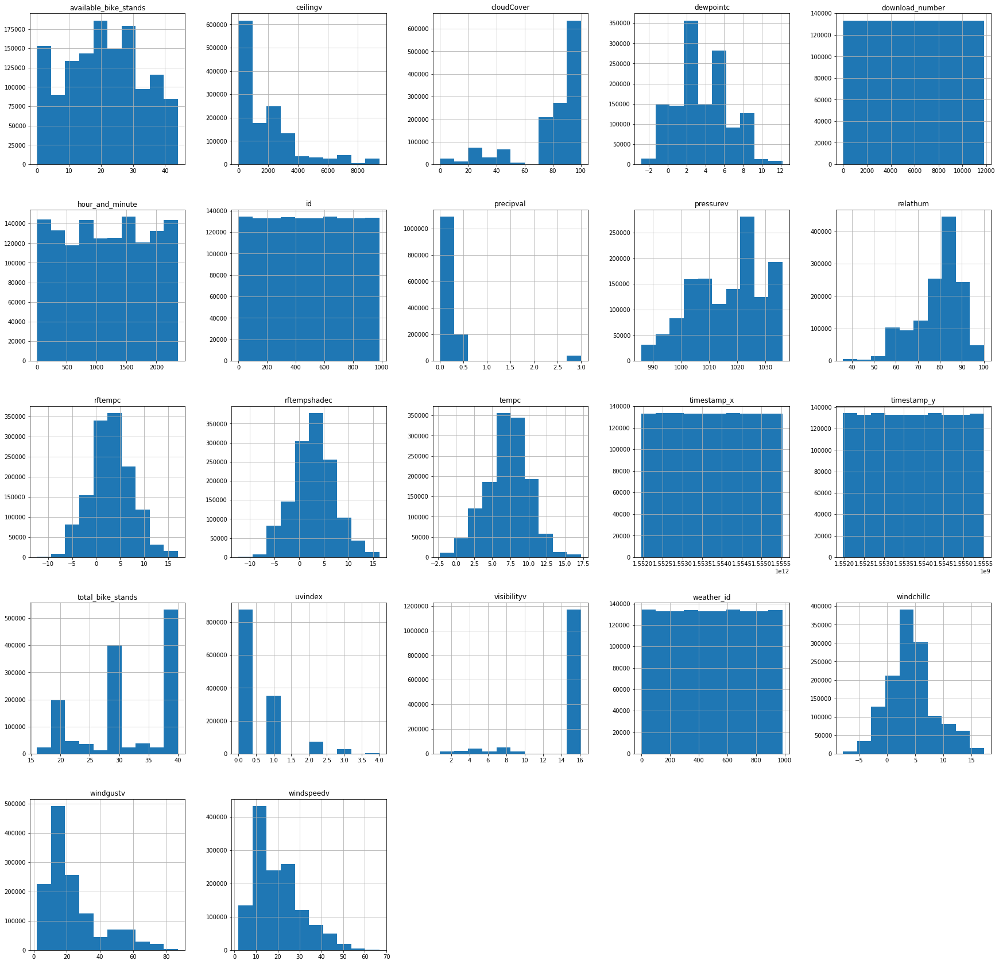

In [16]:
# Plot a histogram of the continuous features (and save in a png file)
df[continuous_columns].hist(figsize=(30,30))
plt.savefig('continuous_histograms_1-1.pdf')

### - Plot box plots for all the continuous features.

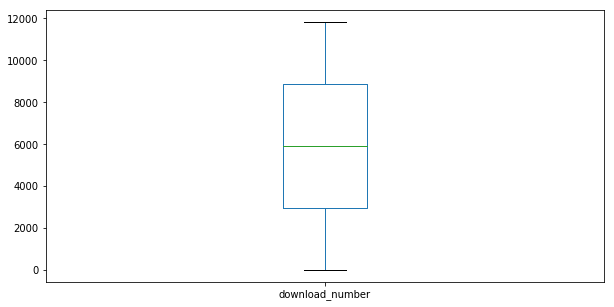

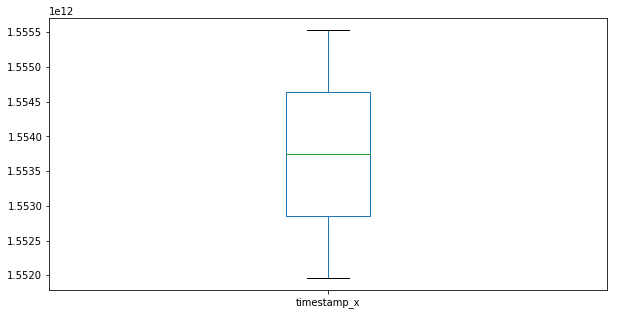

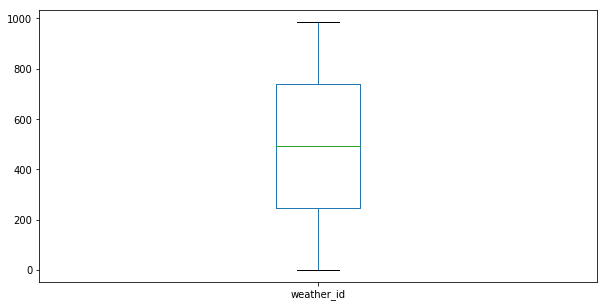

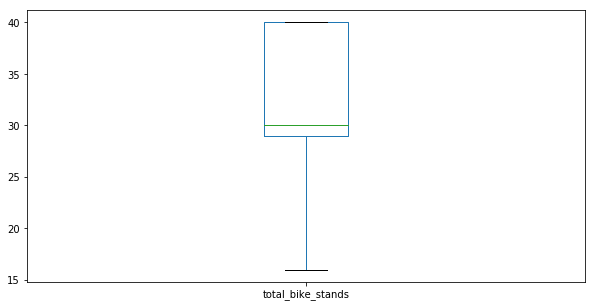

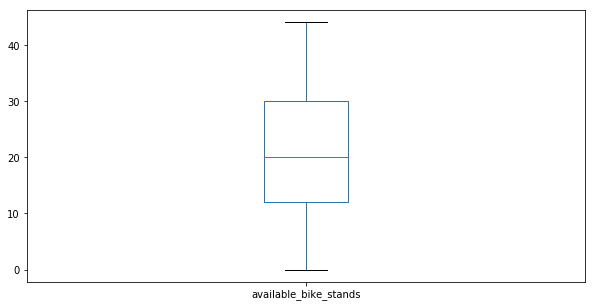

...

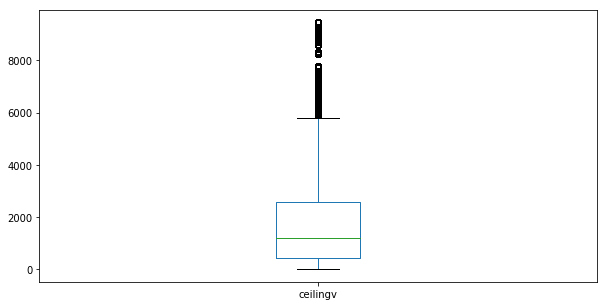

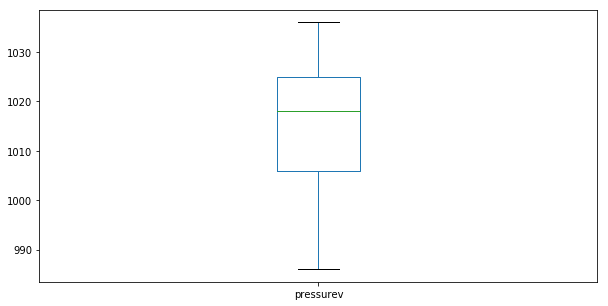

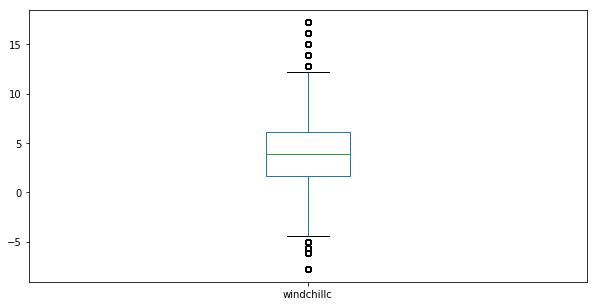

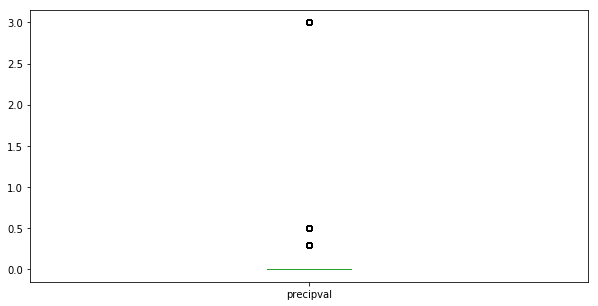

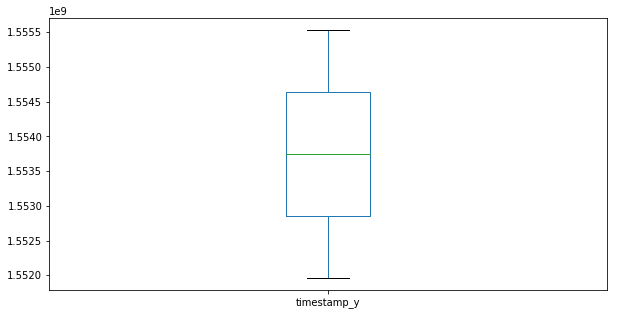

In [17]:
# Plot box plots for all the continuous features and save in a PDF file
pp = PdfPages('continuous_boxplots_1-1.pdf')

for col in continuous_columns:
    f = df[col].plot(kind='box', figsize=(10,5))
    pp.savefig(f.get_figure())
    plt.show()

pp.close()
    

### - Plot bar plots for all the categorical features.

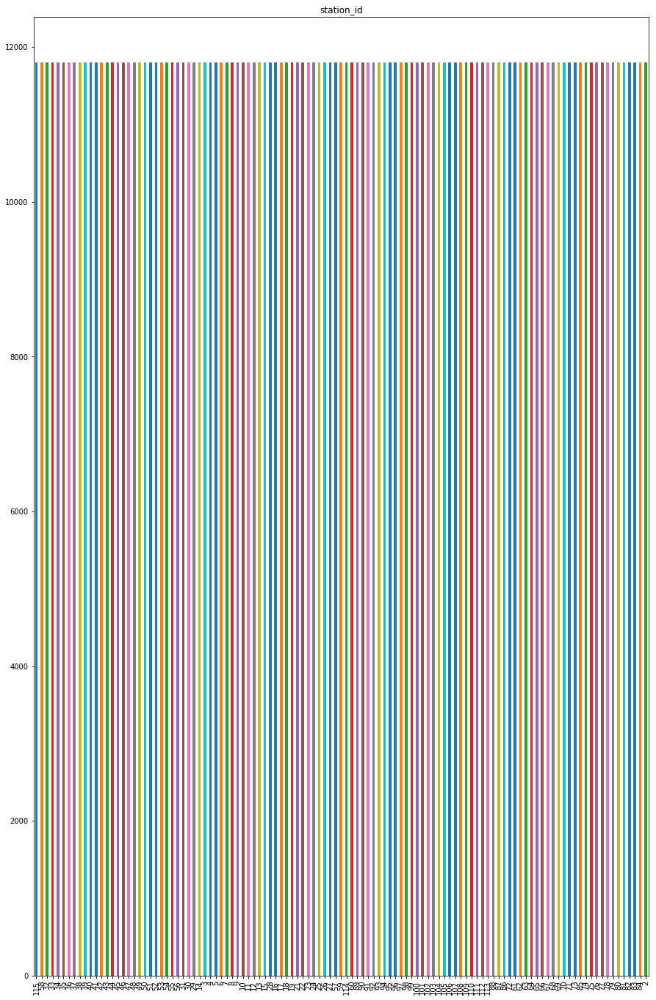

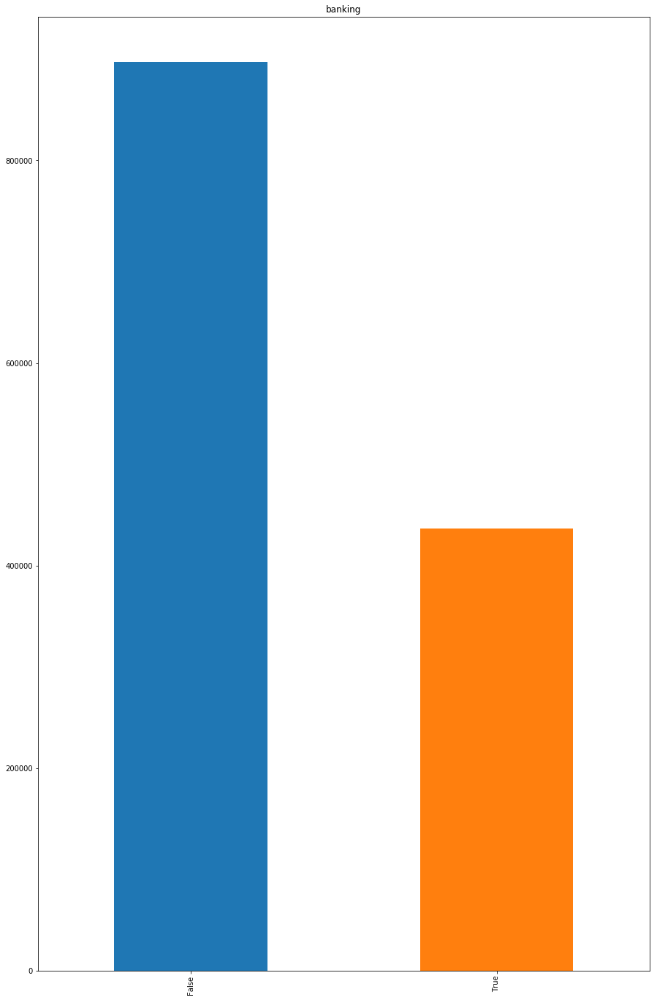

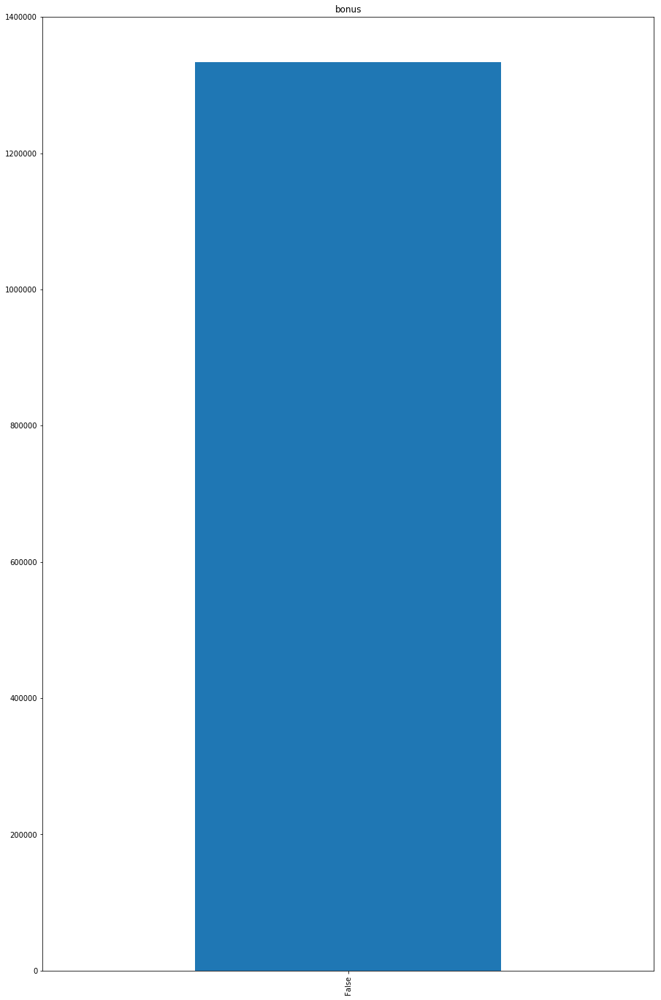

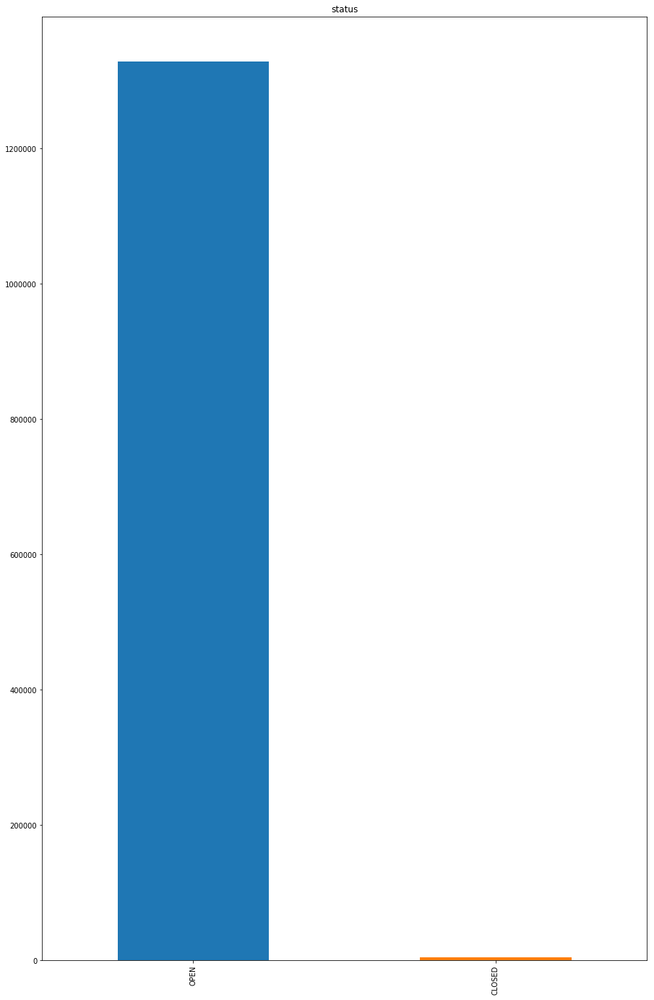

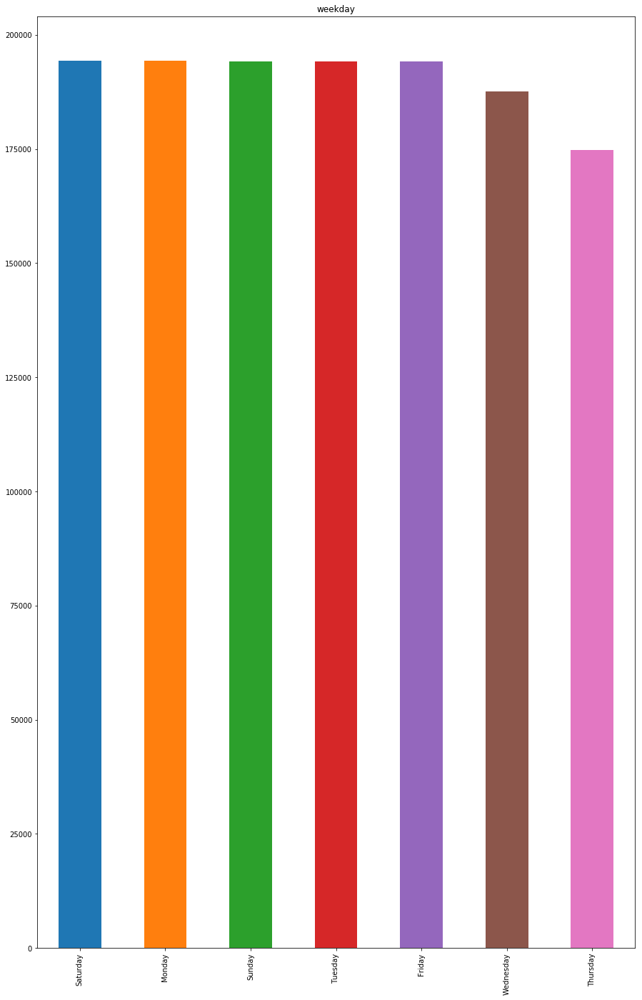

...

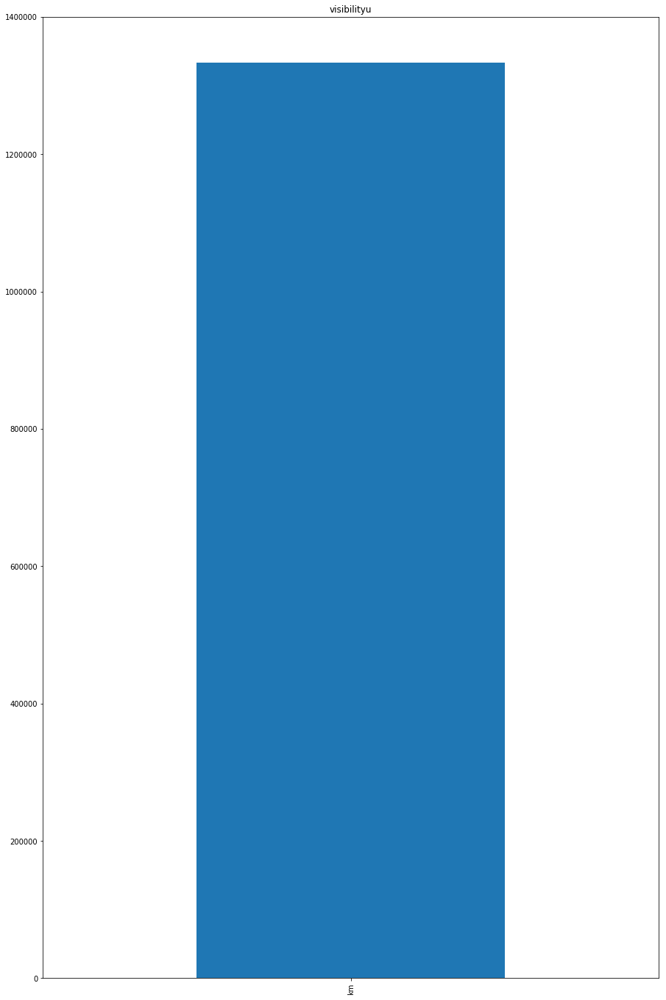

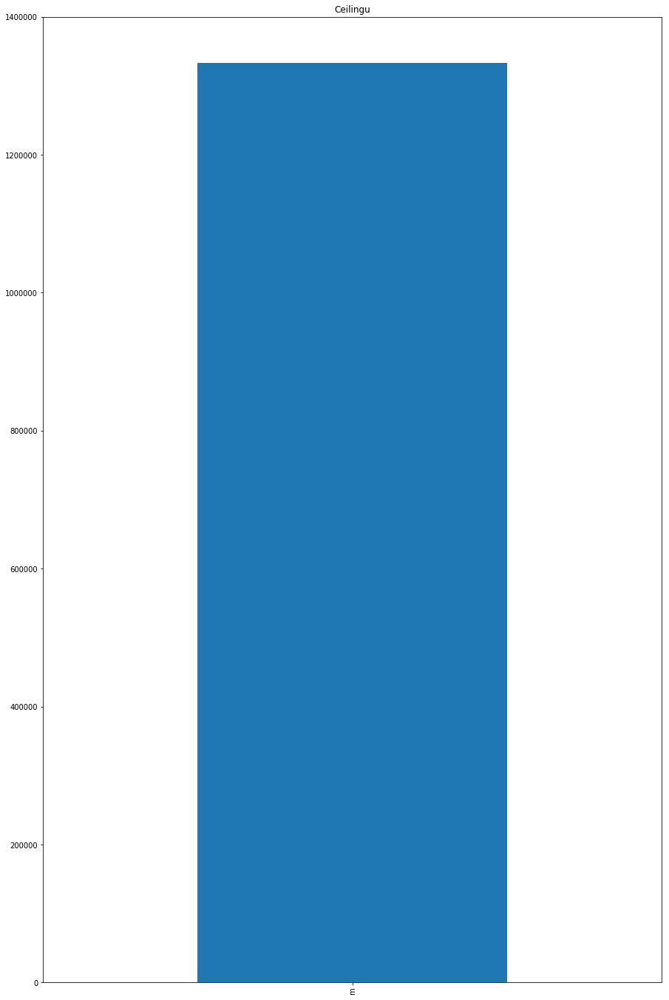

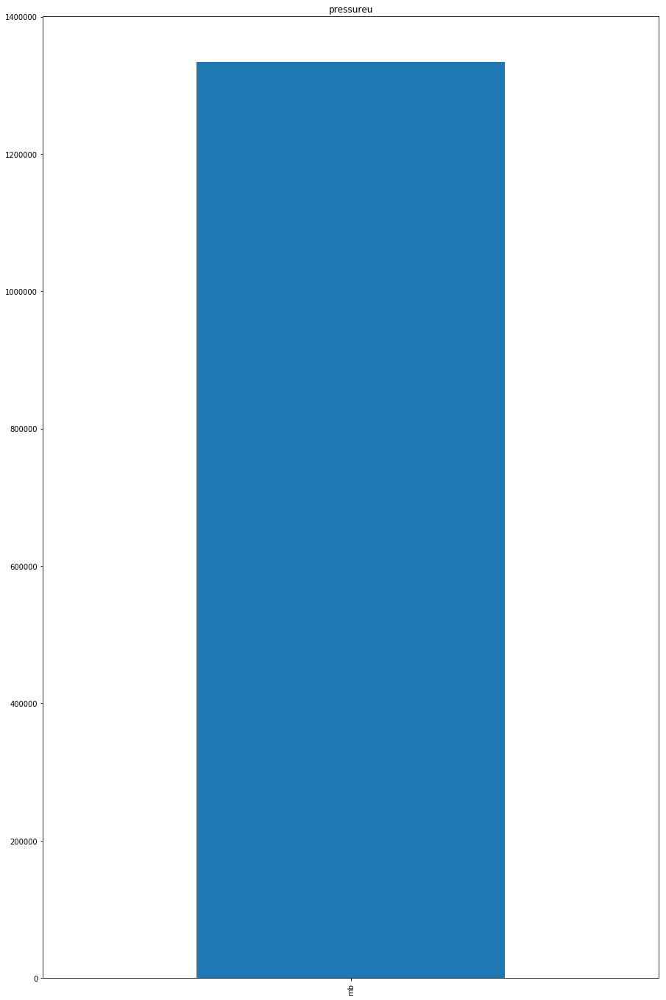

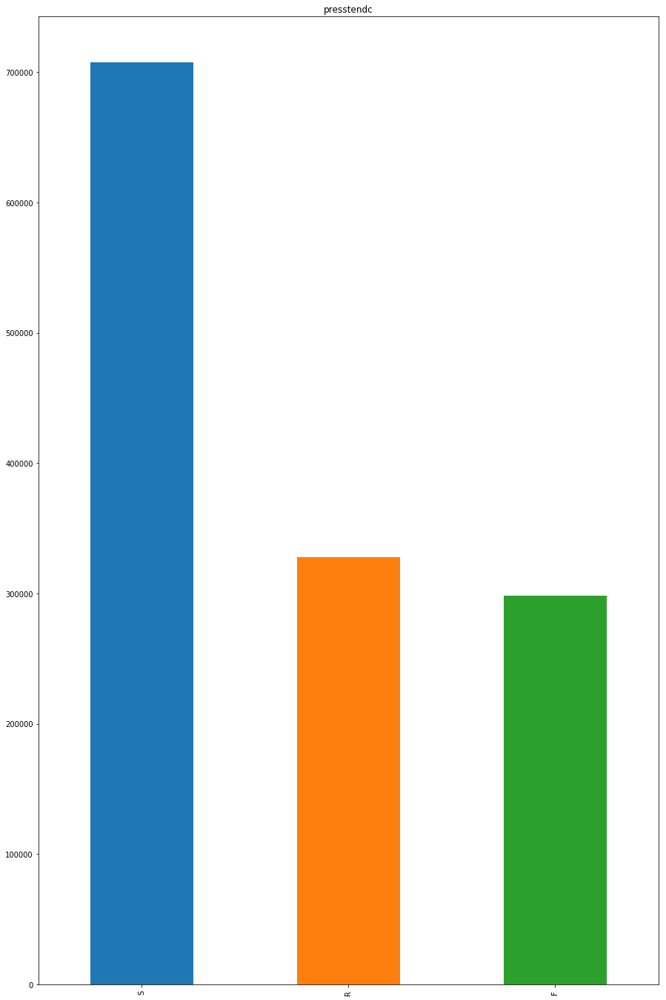

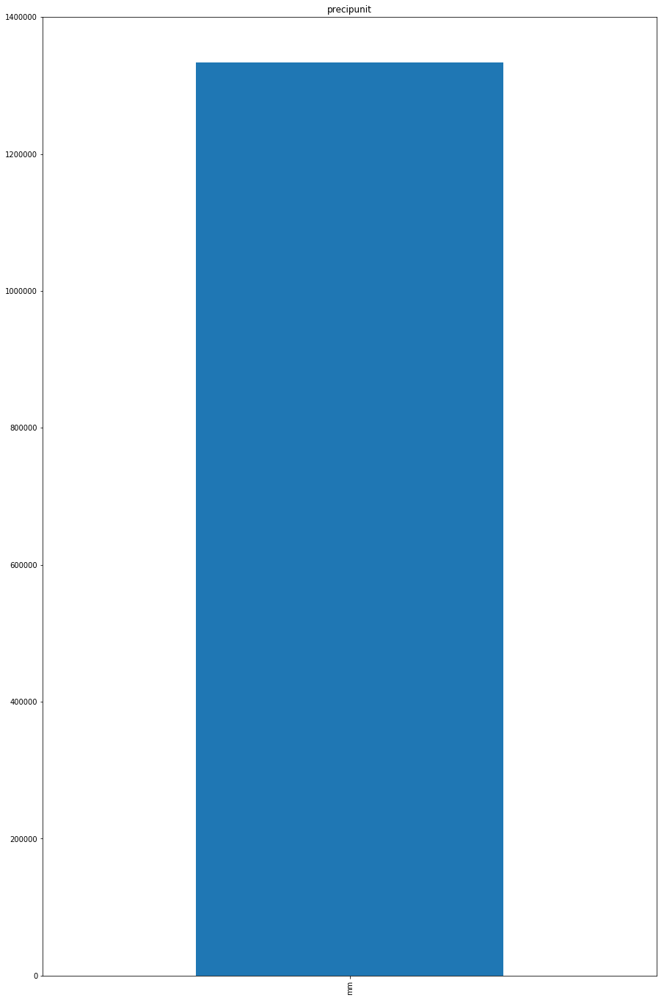

In [18]:
# Plot bar charts for all categorical features and save them in a single PDF file
pp = PdfPages('categorical_barcharts_1-1.pdf')

for column in categorical_columns:
    f = df[column].value_counts().plot(kind='bar', title=column, figsize=(15,24))
    pp.savefig(f.get_figure())
    plt.show()

pp.close()

In [19]:
pd.set_option('display.max_columns', 30)

# Preparing data quality plan for the cleaned CSV file.

### - Mark down all the features where there are potential problems or data quality issues.

The only data quality issues is that there are there are outliers for several features and two stations are missing.

### In adition to the problems above,  some standard checks to find any additional issues will be performed:

### Check for Irregular cardinalities

In [20]:
print("Unique values for:\n- banking:", pd.unique(df.banking.ravel()))
print("\n- bonus:", pd.unique(df.bonus.ravel()))
print("\n- status:", pd.unique(df.status.ravel()))
print("\n- weekday:", pd.unique(df.weekday.ravel()))

print("\n- weather_text:", pd.unique(df.weather_text.ravel()))
print("\n- hasprecip:", pd.unique(df.hasprecip.ravel()))
print("\n- preciptype:", pd.unique(df.preciptype.ravel()))
print("\n- isday:", pd.unique(df.isday.ravel()))
print("\n- winddir:", pd.unique(df.winddir.ravel()))
print("\n- windspeedu:", pd.unique(df.windspeedu.ravel()))

print("\n- windgustu:", pd.unique(df.windgustu.ravel()))
print("\n- visibilityu:", pd.unique(df.visibilityu.ravel()))
print("\n- Ceilingu:", pd.unique(df.Ceilingu.ravel()))
print("\n- pressureu:", pd.unique(df.pressureu.ravel()))
print("\n- presstendc:", pd.unique(df.presstendc.ravel()))
print("\n- precipunit:", pd.unique(df.precipunit.ravel()))  




Unique values for:
- banking: [True False]

- bonus: [False]

- status: ['OPEN' 'CLOSED']

- weekday: ['Thursday' 'Friday' 'Saturday' 'Sunday' 'Monday' 'Tuesday' 'Wednesday']

- weather_text: ['Cloudy' 'Light rain' 'Mostly cloudy' 'Partly cloudy' 'Mostly clear'
 'Drizzle' 'Rain' 'Mostly sunny' 'Partly sunny' 'Snow' 'Sunny' 'Clear'
 'Fog']

- hasprecip: [False True]

- preciptype: [nan 'Rain' 'Snow']

- isday: [True False]

- winddir: ['WNW' 'NW' 'W' 'WSW' 'SW' 'SSW' 'S' 'SSE' 'E' 'ESE' 'N' 'SE' 'NNW' 'ENE'
 'NE' 'NNE']

- windspeedu: ['km/h']

- windgustu: ['km/h']

- visibilityu: ['km']

- Ceilingu: ['m']

- pressureu: ['mb']

- presstendc: ['R' 'S' 'F']

- precipunit: ['mm']


No irregular cardinalities

### Null values

In [21]:
# Check whether there are null values in the data where values would be expected
df.isnull().sum()

download_number                0
station_id                     0
timestamp_x                    0
weather_id                     0
banking                        0
bonus                          0
total_bike_stands              0
available_bike_stands          0
available_bikes                0
status                         0
weekday                        0
hour_and_minute                0
id                             0
weather_text                   0
hasprecip                      0
preciptype               1107174
isday                          0
tempc                          0
rftempc                        0
rftempshadec                   0
relathum                       0
dewpointc                      0
winddir                        0
windspeedv                     0
windspeedu                     0
windgustv                      0
windgustu                      0
uvindex                        0
uvtext                         0
visibilityv                    0
visibility

preciptype is the only feature that contains null values. This is not an issue because preciptype should be null when there is no precipitation.

Overall, no additional problems have surfaced.

In order to investigate how many outliers exist for each feature, the following function can be used:

In [22]:
def Outliers(feature):
    Q1 = feature.quantile(0.25)
    Q3 = feature.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound=Q1 - 1.5 * IQR
    upper_bound=Q3 + 1.5 * IQR
    lower_outliers=feature<lower_bound
    upper_outliers=feature>upper_bound
    count_lower_outliers=np.count_nonzero(upper_outliers)
    count_upper_outliers=np.count_nonzero(lower_outliers)
    total_outliers=count_lower_outliers+count_upper_outliers
    print(total_outliers) 

In [23]:
feature_list=['download_number','timestamp_x','weather_id','total_bike_stands', 'available_bike_stands', 'hour_and_minute','id','tempc','rftempc','rftempshadec','relathum','dewpointc','windspeedv','windgustv','uvindex','visibilityv','cloudCover','ceilingv','pressurev','windchillc','precipval','timestamp_y']

#### Number of outliers for each feature

In [24]:
for i in feature_list:
    df_feature="df."+i
    print(i+":")
    Outliers(eval(df_feature))

download_number:
0
timestamp_x:
0
weather_id:
0
total_bike_stands:
0
available_bike_stands:
0
hour_and_minute:
0
id:
0
tempc:
25764
rftempc:
20340
rftempshadec:
17628
relathum:
6780
dewpointc:
2712
windspeedv:
24408
windgustv:
123396
uvindex:
31188
visibilityv:
164867
cloudCover:
142380
ceilingv:
92208
pressurev:
0
windchillc:
48816
precipval:
245436
timestamp_y:
0


In order to err on the side of caution it was decided to keep the outliers. The machine learning algorithms still need to deal with outliers in the real world as training data that is too perfect and ideal is just another form of bias.

### Summary of data quality plan:

No action will be taken. Outliers will be left in for the time being.

# Exploring relationships between feature pairs:

### Correlations for the numeric features

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5]),
 <a list of 22 Text xticklabel objects>)

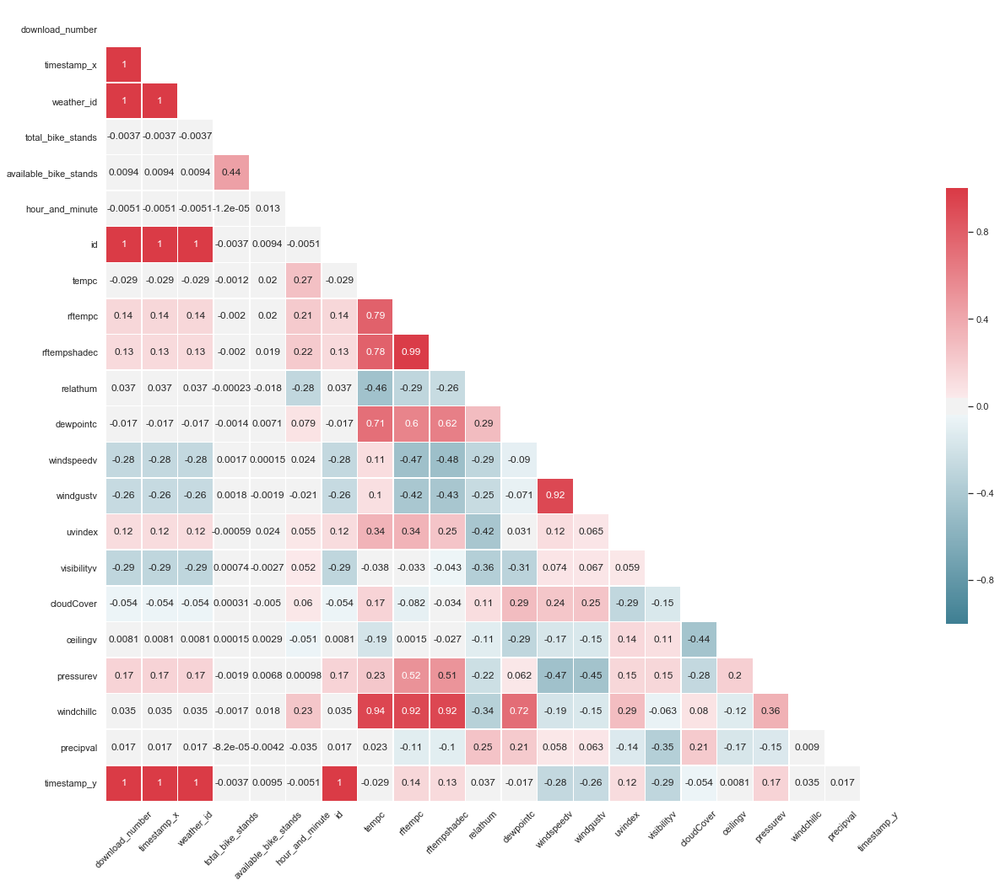

In [25]:
# Correlation matrix using code found on https://stanford.edu/~mwaskom/software/seaborn/examples/many_pairwise_correlations.html
sns.set(style="white")

# Select columns containing continuous data
continuous_columns = df[['download_number','timestamp_x','weather_id','total_bike_stands', 'available_bike_stands', 'hour_and_minute','id','tempc','rftempc','rftempshadec','relathum','dewpointc','windspeedv','windgustv','uvindex','visibilityv','cloudCover','ceilingv','pressurev','windchillc','precipval','timestamp_y']].columns

# Calculate correlation of all pairs of continuous features
corr = df[continuous_columns].corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(21, 19))

# Generate a custom colormap - blue and red
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot=True, mask=mask, cmap=cmap, vmax=1, vmin=-1,
            square=True, xticklabels=True, yticklabels=True,
            linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)
plt.yticks(rotation = 0)
plt.xticks(rotation = 45)

No features strongly correlate with total_bike_stands

### Categorical feature plots

Unsure what to do when the target features are continuous rather than categorical

### Continuous-categorical feature plots.

The following categorical features were compared against available_bike_stands:

- weekday
- weather_text

Boxplots were generated followed by Histograms

<Figure size 720x720 with 0 Axes>

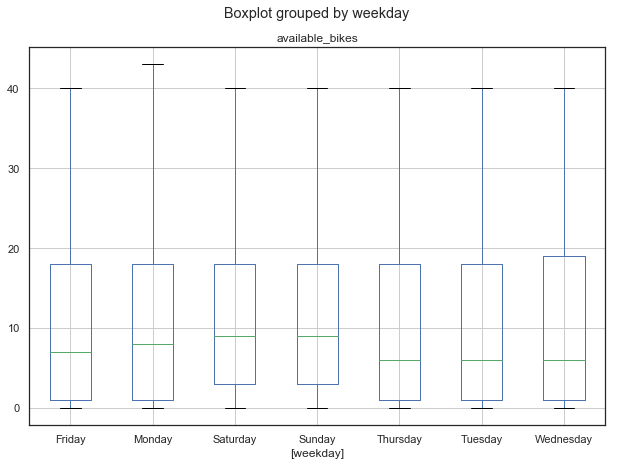

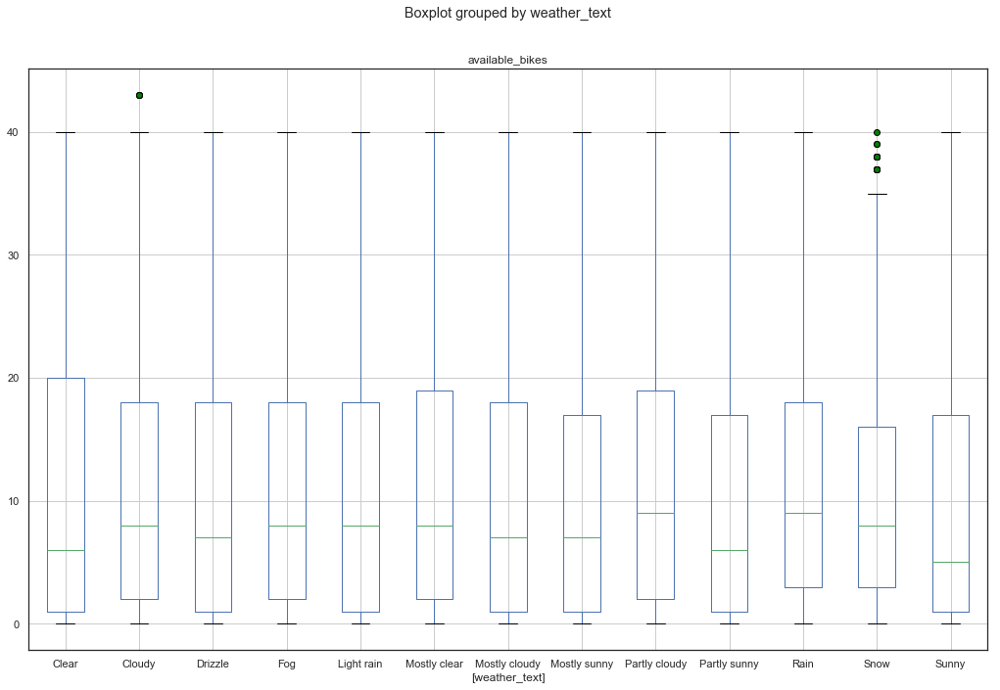

In [71]:
plt.figure()
flierprops = dict(marker='o', markerfacecolor='green', markersize=6,
                  linestyle='none')


df.boxplot(column=['available_bikes'], by=['weekday'], flierprops=flierprops, figsize=(10,7))


df.boxplot(column=['available_bikes'], by=['weather_text'], flierprops=flierprops, figsize=(17,11))





array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a172b4e10>]],
      dtype=object)

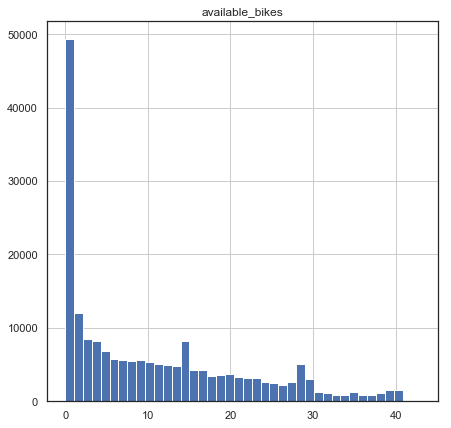

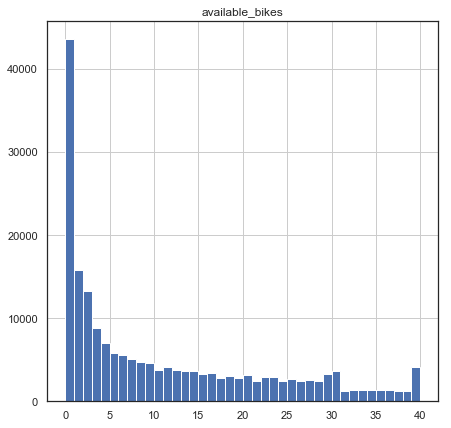

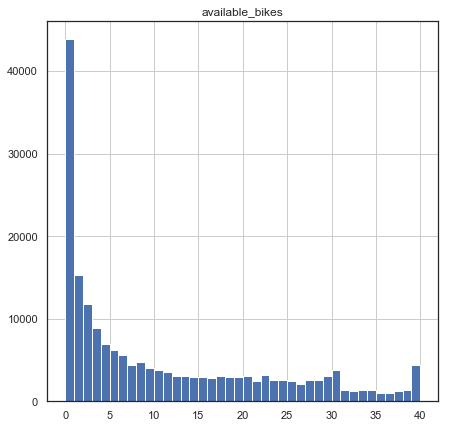

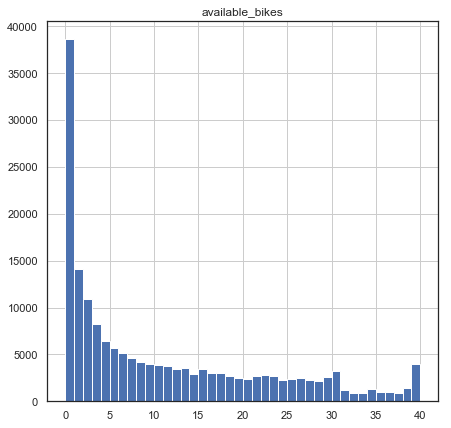

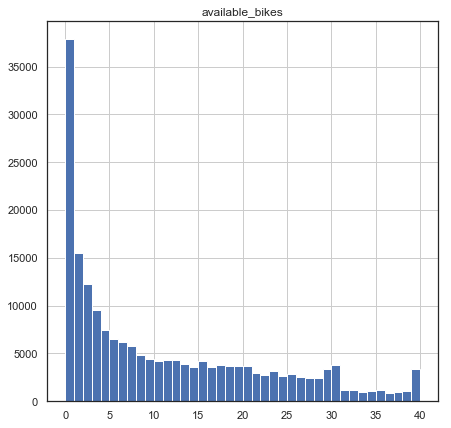

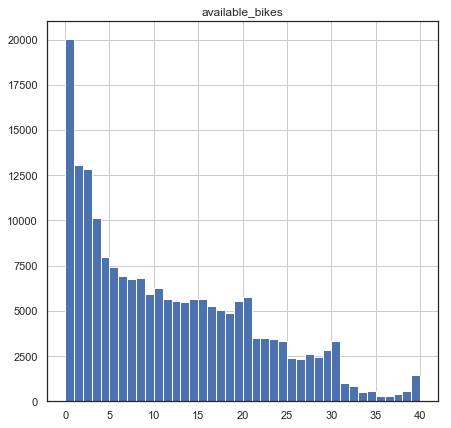

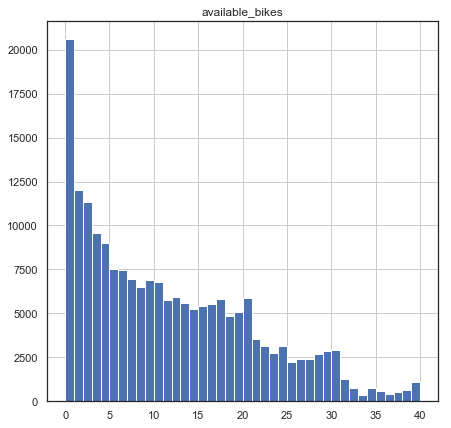

In [27]:
df[df['weekday'] == 'Monday'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weekday'] == 'Tuesday'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weekday'] == 'Wednesday'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weekday'] == 'Thursday'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weekday'] == 'Friday'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weekday'] == 'Saturday'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weekday'] == 'Sunday'][['available_bikes']].hist(figsize=(7,7), bins=40)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a19558d30>]],
      dtype=object)

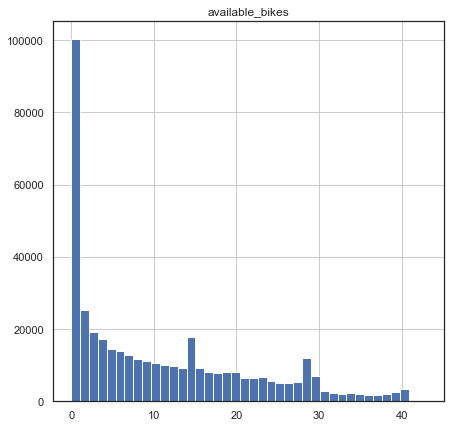

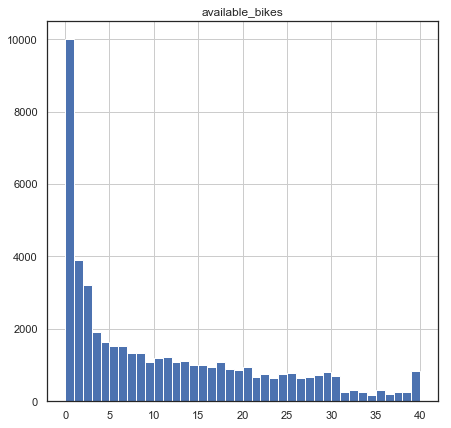

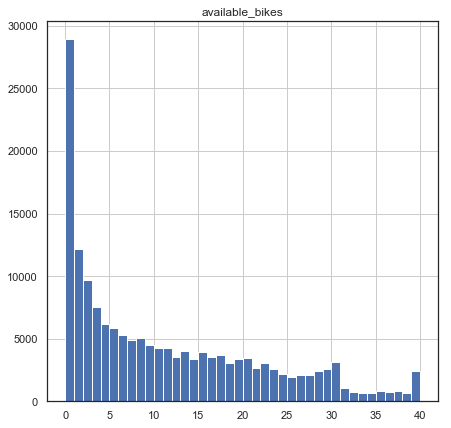

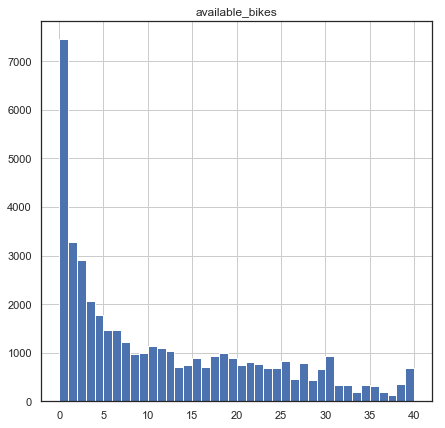

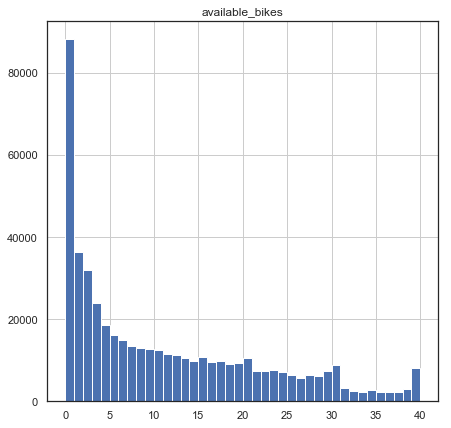

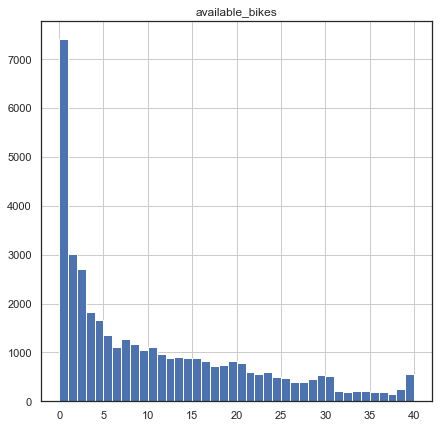

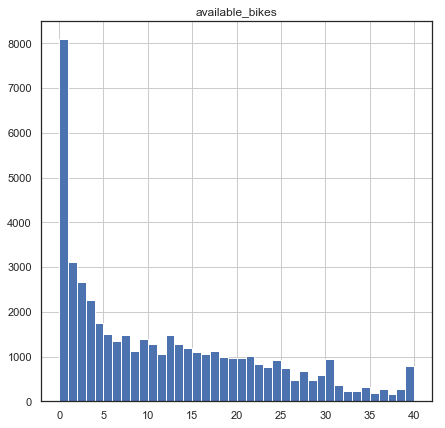

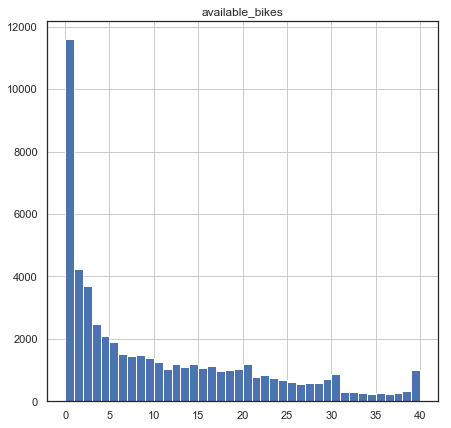

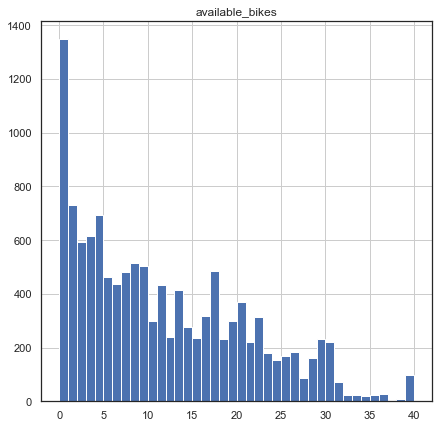

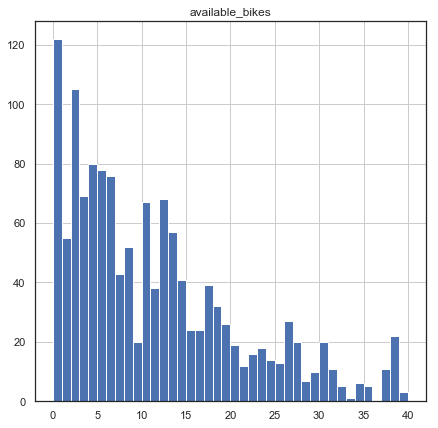

In [28]:
df[df['weather_text'] == 'Cloudy'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Drizzle'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Light rain'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Mostly clear'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Mostly cloudy'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Mostly sunny'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Partly cloudy'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Partly sunny'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Rain'][['available_bikes']].hist(figsize=(7,7), bins=40)
df[df['weather_text'] == 'Snow'][['available_bikes']].hist(figsize=(7,7), bins=40)




# Further Visualisations

In [29]:
def cleanCSV():
    df = pd.read_csv('dynamic_weather.csv',  keep_default_na=True, sep=',\s+', delimiter=',', skipinitialspace=True)
    df=df[['station_id','weekday','hour_and_minute', 'weather_text','hasprecip','isday','tempc','rftempc', 'windspeedv','available_bikes']]
    
    df['hour'] = df['hour_and_minute'] // 100
    
    categorical_columns = df[['station_id', 'weekday','weather_text','hour']].columns
    
    for column in categorical_columns:
        df[column] = df[column].astype('category')
    df=df.drop(['hour_and_minute'], axis=1)
    return df

In [30]:
df=cleanCSV()

/anaconda3/envs/comp47350py37/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3185: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  if (yield from self.run_code(code, result)):


### - Plot the number of available bikes for each hour the day for every station on a given day of the week

In [31]:
def plotBikes(station_id,weekday):
    meanBikesList=[]
    for i in range(0,24):
        dfChart=df[(df.station_id == station_id) & (df.weekday == weekday)& (df.hour == i)] 
        meanBikes=dfChart['available_bikes'].mean()
        meanBikesList.append(meanBikes)
    return meanBikesList
    

In [32]:
unique_station_id=[]

for station in df['station_id']:
    if station not in unique_station_id:
        unique_station_id.append(station)

In [33]:
unique_day=[]

for day in df['weekday']:
    if day not in unique_day:
        unique_day.append(day)

In [34]:
myhour=[]
for j in range (0,24):
    myhour.append(j) 


In [61]:
def createCharts(station_id):
    
    for i in unique_day:

        myBikes=plotBikes(station_id, i)

        plt.plot(myhour,myBikes, label=i)


    leg = plt.legend();
    title = plt.title("Station "+str(station_id));

    from pylab import rcParams
    rcParams['figure.figsize'] = 10,10

    plt.xlabel('hour of the day')
    plt.ylabel('available bikes')
    plt.savefig('Station'+str(station_id)+'.png')

    plt.show()
    


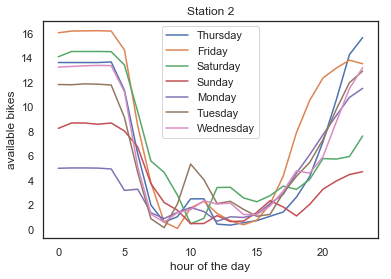

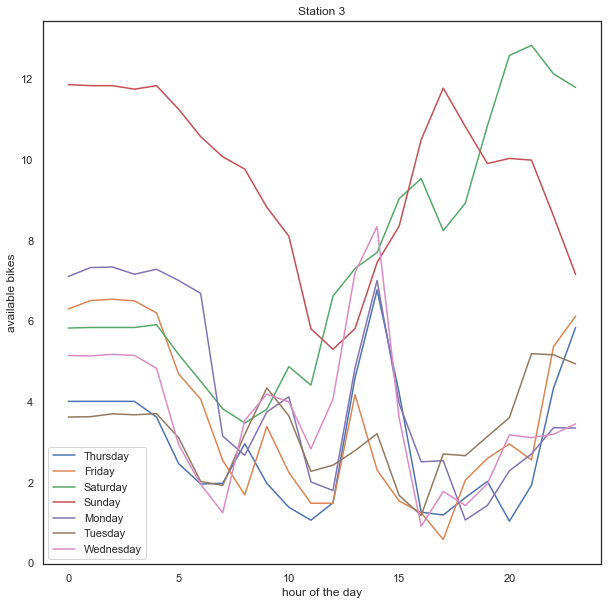

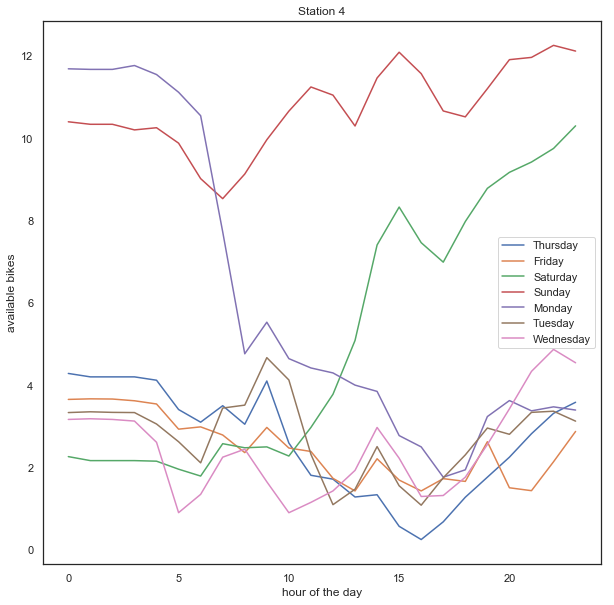

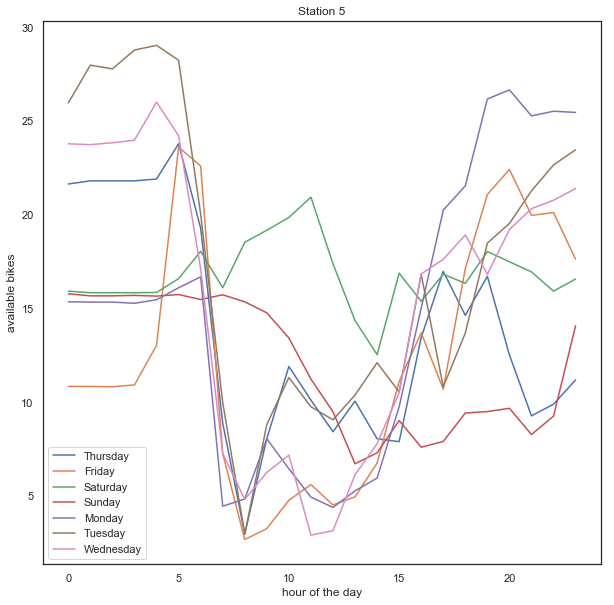

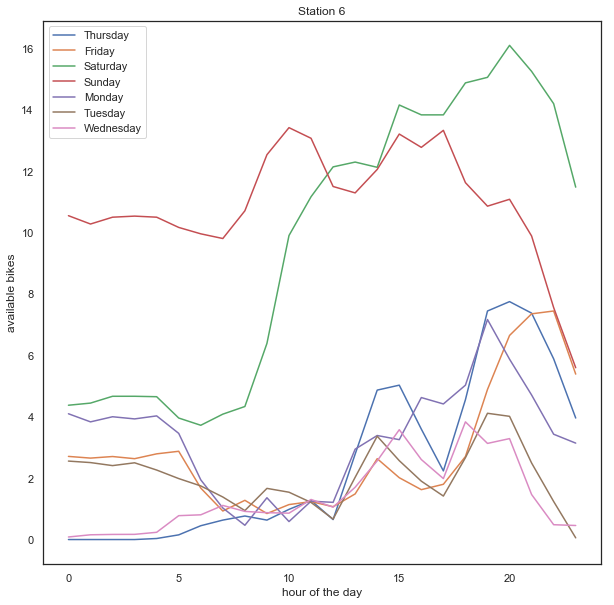

...

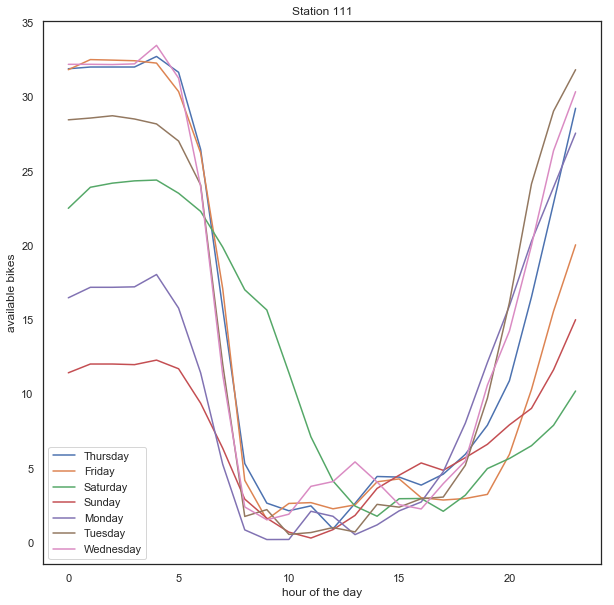

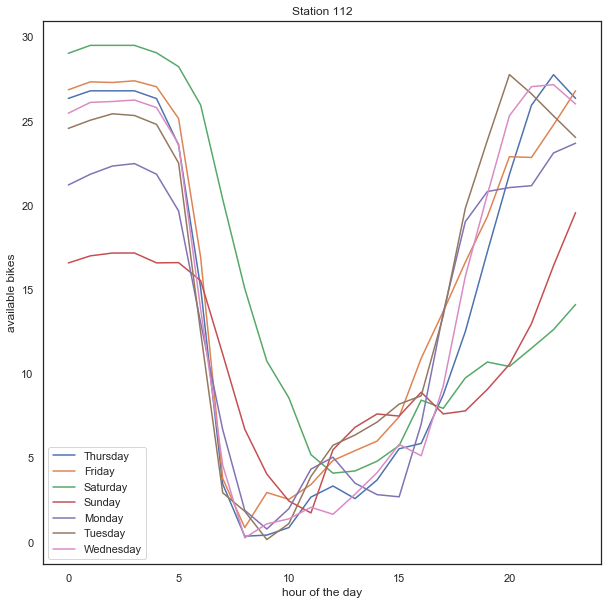

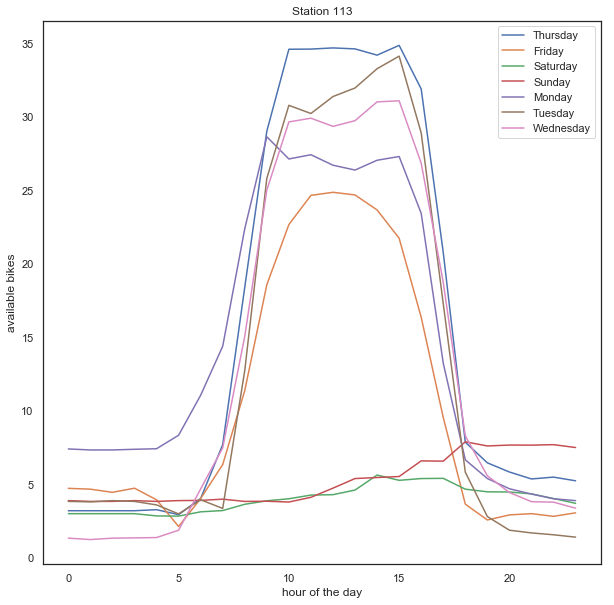

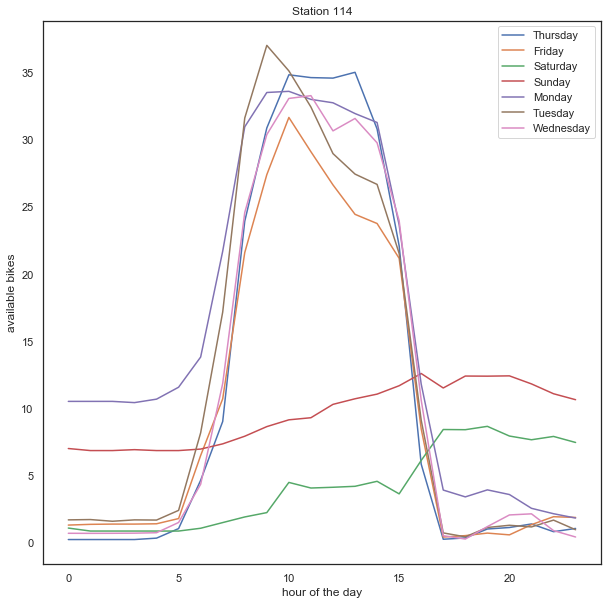

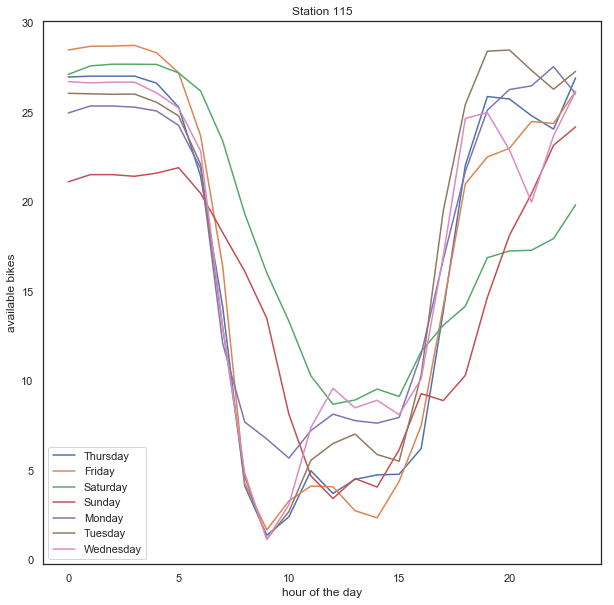

In [78]:
for station in unique_station_id:
    createCharts(station)

## Data Preparation

In [39]:
df_dummies = pd.get_dummies(df)
X = df_dummies.drop('available_bikes', axis=1)
y = df_dummies['available_bikes']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=66, shuffle=False)



## Modelling & Evaluation

### Linear Regression

In [40]:
from sklearn import linear_model
lm = linear_model.LinearRegression()

In [41]:
model = lm.fit(X,y)

In [42]:
predictions = lm.predict(X)

In [43]:
# Calculate the absolute errors
lm_errors = abs(predictions - y)
# Print out the mean absolute error (mae)
print('Mean Absolute Error:', round(np.mean(lm_errors), 2), 'bikes.')
print('Standard Deviation:', round(np.std(lm_errors), 2), 'bikes.')

Mean Absolute Error: 8.03 bikes.
Standard Deviation: 5.65 bikes.


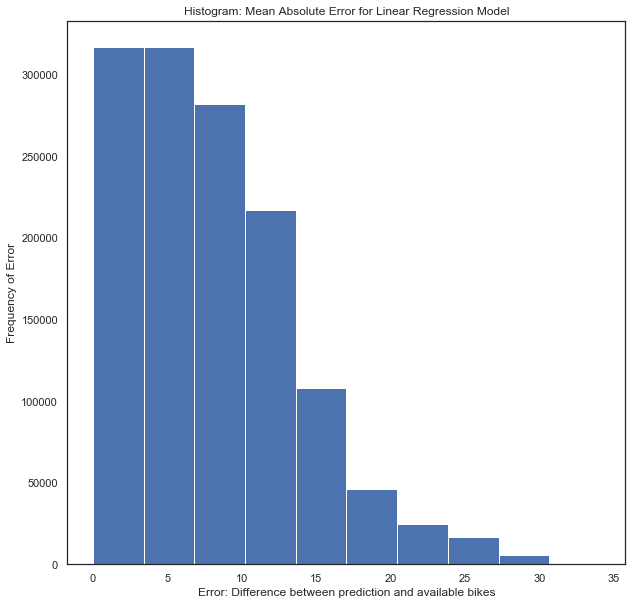

In [66]:
plt.title('Histogram: Mean Absolute Error for Linear Regression Model')
plt.xlabel('Error: Difference between prediction and available bikes')
plt.ylabel('Frequency of Error')
plt.hist(lm_errors)
plt.savefig('LinearRegression.png')

### Random Forest

In [44]:
def buildModel(df):
    rf = RandomForestRegressor(n_estimators = 10, random_state = 66)
    rf.fit(X_train,y_train)
    rf_predict = rf.predict(X_test)
    filename = 'finalized_model.sav'
    joblib.dump(rf, filename)

In [45]:
buildModel(df)

In [46]:
filename = 'finalized_model.sav'
rf = joblib.load(filename)

In [47]:
rf_predict = rf.predict(X_test)

In [48]:
# Calculate the absolute errors
errors = abs(rf_predict - y_test)
# Print out the mean absolute error 
print('Mean Absolute Error:', round(np.mean(errors), 2), 'bikes.')
print('Standard Deviation:', round(np.std(errors), 2), 'bikes.')

Mean Absolute Error: 6.15 bikes.
Standard Deviation: 6.07 bikes.


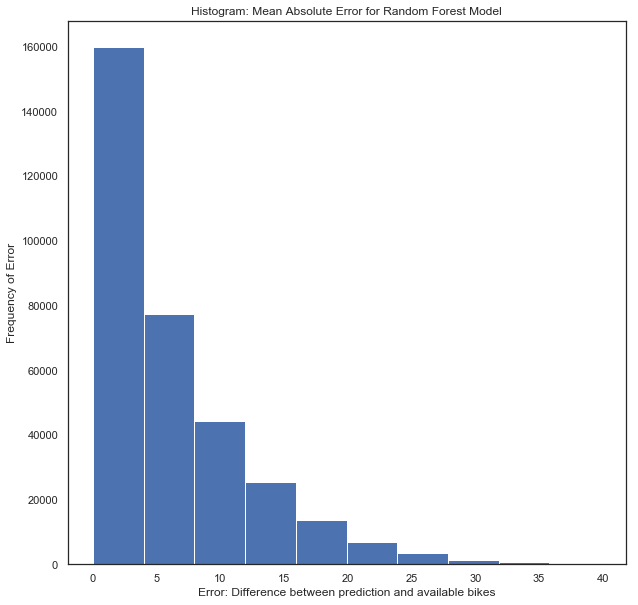

In [67]:
plt.title('Histogram: Mean Absolute Error for Random Forest Model')
plt.xlabel('Error: Difference between prediction and available bikes')
plt.ylabel('Frequency of Error')
plt.hist(errors)
plt.savefig('RandomForest.png')